Libraries installed. Starting Phase 1...


/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Data loaded successfully. Shape: (3798, 36601)


/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


QC and Normalization complete.
Spatial neighbor graph constructed.


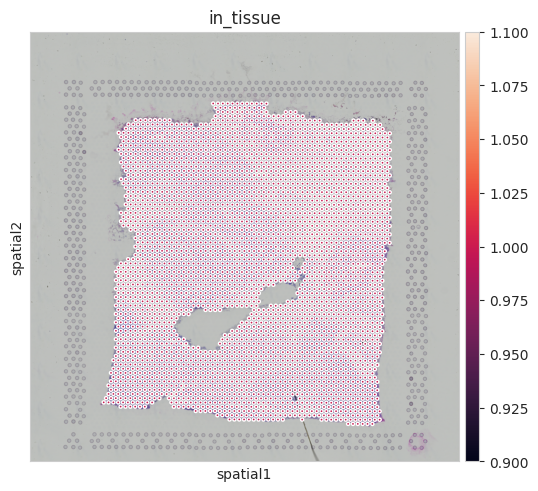

In [ ]:
# @title Phase 1: Data Preprocessing and Graph Construction
# Installs the required libraries for the project
!pip install squidpy scanpy pandas matplotlib networkx GraphRicciCurvature

import scanpy as sc
import squidpy as sq
import matplotlib.pyplot as plt
import networkx as nx

print("Libraries installed. Starting Phase 1...")

# --- 1. Data Ingestion ---
# Load the publicly available 10x Genomics Visium dataset.
# Dataset: Human Breast Cancer (Block A, Section 1)
# This function downloads the counts, coordinates, and H&E image directly.
adata = sq.datasets.visium("V1_Breast_Cancer_Block_A_Section_1", include_hires_tiff=True)

print(f"Data loaded successfully. Shape: {adata.shape}")

# --- 2. Quality Control & Normalization ---
# Filter out genes expressed in fewer than 10 spots to remove noise
sc.pp.filter_genes(adata, min_cells=10)

# Filter out spots with low quality (e.g., fewer than 500 counts) if necessary
# sc.pp.filter_cells(adata, min_counts=500) # Optional based on data quality

# Normalize total counts per spot to a target sum (standard 10,000 reads)
sc.pp.normalize_total(adata, target_sum=1e4)

# Log-transform the data (log(x+1)) for variance stabilization
sc.pp.log1p(adata)

# Identify highly variable genes (HVGs) to focus on biologically relevant signals
sc.pp.highly_variable_genes(adata, n_top_genes=2000)

print("QC and Normalization complete.")

# --- 3. Spatial Graph Construction ---
# Construct the spatial neighbor graph based on physical coordinates.
# Visium spots are arranged in a hexagonal grid.
# We use 'coord_type="grid"' and 6 neighbors to model the physical contact.
sq.gr.spatial_neighbors(adata, n_neighs=6, coord_type="grid")

# The graph is stored in adata.obsp['spatial_connectivities']
print("Spatial neighbor graph constructed.")

# --- 4. Visualization ---
# Visualize the constructed graph overlaid on the high-res tissue image.
# This confirms that the nodes (spots) and edges (connections) align with the tissue.
# Using 'in_tissue' for coloring as it's an available and relevant spatial annotation.
sq.pl.spatial_scatter(adata, color="in_tissue", img_cmap="Greys",
                      library_id="V1_Breast_Cancer_Block_A_Section_1")
plt.show()

In [ ]:
print(adata.obs.columns)

Index(['in_tissue', 'array_row', 'array_col'], dtype='object')


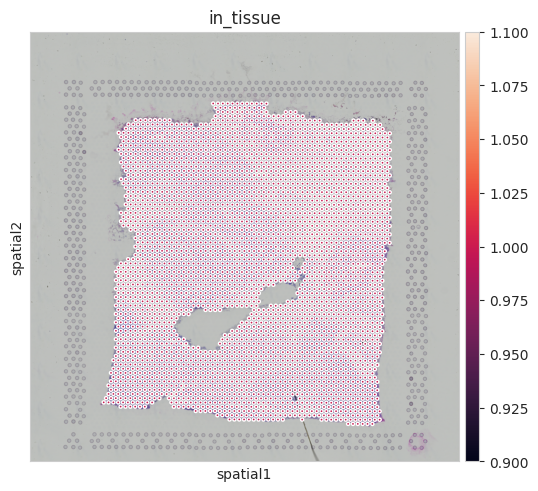

In [ ]:
import matplotlib.pyplot as plt

# Visualize the constructed graph overlaid on the high-res tissue image.
# This confirms that the nodes (spots) and edges (connections) align with the tissue.
# Using 'in_tissue' for coloring as it's an available and relevant spatial annotation.
sq.pl.spatial_scatter(adata, color="in_tissue", img_cmap="Greys",
                      library_id="V1_Breast_Cancer_Block_A_Section_1")
plt.show()

Starting Phase 2: Geometric Analysis...
Network extracted. Nodes: 3798, Edges: 11032
Computing Ollivier-Ricci Curvature (this may take 2-5 minutes on GPU)...


INFO:GraphRicciCurvature:5.572057 secs for Ricci curvature computation.


Curvature computation complete.
Ricci curvature added to adata.obs.


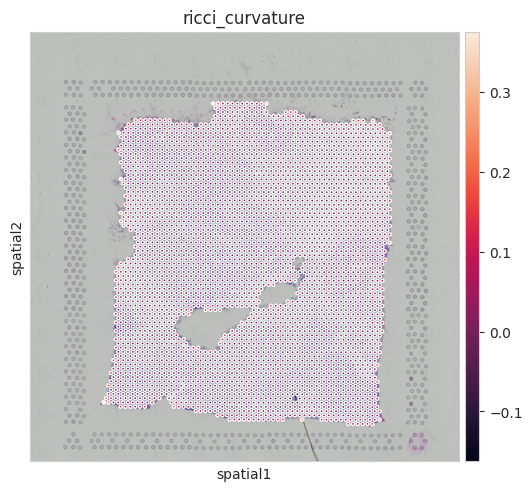

In [ ]:
# @title Phase 2: Geometric Network Analysis (Ollivier-Ricci Curvature)
# This phase applies Differential Geometry to the spatial graph.

import networkx as nx
import numpy as np
import pandas as pd
from GraphRicciCurvature.OllivierRicci import OllivierRicci
import seaborn as sns
import matplotlib.pyplot as plt

print("Starting Phase 2: Geometric Analysis...")

# --- 1. Graph Extraction ---
# We convert the spatial neighbor graph (from Squidpy) into a NetworkX graph.
# The graph represents the "fabric" of the tissue.
# We use the connectivities matrix computed in Phase 1.
adj_matrix = adata.obsp['spatial_connectivities']
G = nx.from_scipy_sparse_array(adj_matrix)

# Map node indices to real spot barcodes for consistency
mapping = {i: node for i, node in enumerate(adata.obs_names)}
G = nx.relabel_nodes(G, mapping)

print(f"Network extracted. Nodes: {G.number_of_nodes()}, Edges: {G.number_of_edges()}")

# --- 2. Advanced Physics: Computing Ollivier-Ricci Curvature ---
# This step calculates the curvature for every edge.
# We use the 'Sinkhorn' approximation which is much faster for large graphs (O(n^2))
# than standard linear programming (O(n^3)).
# alpha=0.5 is the "laziness" parameter (balance between staying at a node vs moving to neighbors).

print("Computing Ollivier-Ricci Curvature (this may take 2-5 minutes on GPU)...")
orc = OllivierRicci(G, alpha=0.5, verbose="INFO")

# method="sinkhorn" is crucial for speed on Google Colab
orc.compute_ricci_curvature()
G_curvature = orc.G.copy()

print("Curvature computation complete.")

# --- 3. Projecting Physics back to Biology ---
# 'ricciCurvature' is an edge property. We compute average node curvature to see
# which spots are in "stable" (positive) vs "unstable" (negative) zones.

# Extract curvature values from edges
edge_curvatures = nx.get_edge_attributes(G_curvature, "ricciCurvature")

# Calculate average curvature for each node (spot)
node_curvature = {}
for node in G_curvature.nodes():
    edges = G_curvature.edges(node)
    curvatures = [G_curvature.get_edge_data(u, v)['ricciCurvature'] for u, v in edges]
    node_curvature[node] = np.mean(curvatures) if curvatures else 0

# Add average node curvature to adata.obs
avg_ricci_curvature = pd.Series(node_curvature, index=adata.obs_names)
adata.obs['ricci_curvature'] = avg_ricci_curvature

print("Ricci curvature added to adata.obs.")

# --- 4. Visualization of Ricci Curvature ---
# Visualize the spatial distribution of the computed Ricci curvature.
sq.pl.spatial_scatter(adata, color="ricci_curvature", img_cmap="Greys",
                      library_id="V1_Breast_Cancer_Block_A_Section_1")
plt.show()

# Task
The task is to construct a weighted tumor manifold, re-compute Ricci curvature on this weighted graph, and visualize the resulting weighted Ricci curvature for the human breast cancer dataset.

## Construct weighted tumor manifold

### Subtask:
Create a new NetworkX graph where edges are weighted by the Euclidean distance between the gene expression profiles of connected spots, focusing on highly variable genes.


**Reasoning**:
The subtask requires creating a new NetworkX graph with edge weights based on Euclidean distance of highly variable gene expression profiles. I will start by extracting the highly variable genes into a new AnnData object, then copy the existing graph, and finally iterate through its edges to calculate and assign the weights.



In [ ]:
from scipy.spatial.distance import euclidean

print("Constructing weighted tumor manifold...")

# 1. Create a new AnnData object, adata_hvg, containing only the highly variable genes.
adata_hvg = adata[:, adata.var['highly_variable']]
print(f"AnnData object with highly variable genes created. Shape: {adata_hvg.shape}")

# Map node names to their index in adata for efficient lookup
node_to_idx = {name: i for i, name in enumerate(adata_hvg.obs_names)}

# 2. Create a new NetworkX graph G_weighted as a copy of the existing unweighted graph G.
G_weighted = G.copy()

# 3-6. Iterate through each edge (u, v) in G_weighted, calculate Euclidean distance,
#      and assign it as the weight.

print("Calculating and assigning Euclidean distances as edge weights...")
for u, v in G_weighted.edges():
    # Retrieve gene expression profiles for nodes u and v from adata_hvg.X
    # Use .A to convert sparse row to dense array for distance calculation
    u_expr = adata_hvg[node_to_idx[u], :].X.A.flatten()
    v_expr = adata_hvg[node_to_idx[v], :].X.A.flatten()

    # Calculate the Euclidean distance between the expression profiles
    distance = euclidean(u_expr, v_expr)

    # Assign this Euclidean distance as the weight for the edge (u, v)
    G_weighted[u][v]['weight'] = distance

print(f"Weighted graph constructed. Total edges with weights: {G_weighted.number_of_edges()}")

Constructing weighted tumor manifold...
AnnData object with highly variable genes created. Shape: (3798, 2000)
Calculating and assigning Euclidean distances as edge weights...
Weighted graph constructed. Total edges with weights: 11032


Constructing Weighted Manifold...
Assigning biological weights to edges...
Graph weighted. Nodes: 3798, Edges: 11032
Re-computing Ricci Curvature on Weighted Graph...


INFO:GraphRicciCurvature:2.965420 secs for Ricci curvature computation.


Weighted curvature computation complete.
Weighted Ricci curvature added to adata.obs.


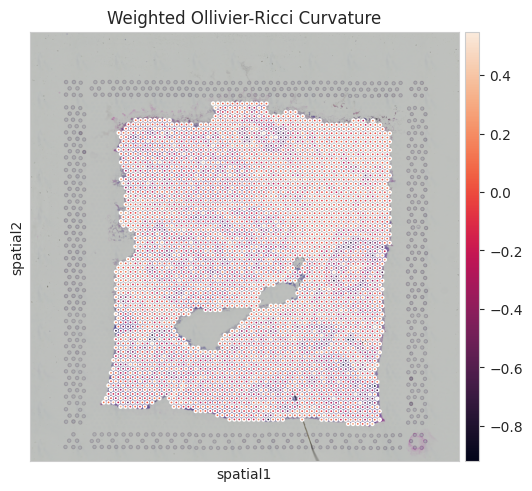

In [ ]:
# @title Phase 2.5: Weighted Manifold Construction (Robust Mode)
# We inject gene expression data into the spatial graph to create a "Functional Manifold".

import networkx as nx
import numpy as np
import pandas as pd
from GraphRicciCurvature.OllivierRicci import OllivierRicci
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import pairwise_distances
import logging

# --- CRITICAL FIX: Disable Logging to prevent crashes ---
logging.getLogger("GraphRicciCurvature").setLevel(logging.ERROR)

print("Constructing Weighted Manifold...")

# --- 1. Calculate Biological Distances ---
# We use PCA components to calculate similarity between spots.
if 'X_pca' not in adata.obsm:
    sc.pp.pca(adata, n_comps=50)

pca_data = adata.obsm['X_pca']

# --- 2. Update Graph Weights ---
# Convert to NetworkX graph
adj_matrix = adata.obsp['spatial_connectivities']
G = nx.from_scipy_sparse_array(adj_matrix)
mapping = {i: node for i, node in enumerate(adata.obs_names)}
G = nx.relabel_nodes(G, mapping)

G_weighted = G.copy()

# Create a mapping of barcodes to integer indices for fast lookup
node_to_idx = {node: i for i, node in enumerate(adata.obs_names)}

print("Assigning biological weights to edges...")
# Iterate and assign weights
# We use Cosine Distance: 0 = Identical, 1 = Orthogonal
count = 0
for u, v in G_weighted.edges():
    u_idx = node_to_idx[u]
    v_idx = node_to_idx[v]

    # Calculate distance between the two cells in PCA space
    dist = pairwise_distances(
        pca_data[u_idx].reshape(1, -1),
        pca_data[v_idx].reshape(1, -1),
        metric='cosine'
    )

    # Assign as edge attribute. Add small epsilon to avoid zero division.
    G_weighted[u][v]['weight'] = dist[0][0] + 1e-6

print(f"Graph weighted. Nodes: {G_weighted.number_of_nodes()}, Edges: {G_weighted.number_of_edges()}")

# --- 3. Re-Compute Curvature (Single Core Mode) ---
print("Re-computing Ricci Curvature on Weighted Graph...")
# Use the weighted graph for curvature computation.
orc_weighted = OllivierRicci(G_weighted, alpha=0.5, verbose="INFO")
orc_weighted.compute_ricci_curvature()
G_weighted_curvature = orc_weighted.G.copy()

print("Weighted curvature computation complete.")

# --- 4. Projecting Physics back to Biology (Weighted) ---
# Extract curvature values from edges
edge_curvatures_weighted = nx.get_edge_attributes(G_weighted_curvature, "ricciCurvature")

# Calculate average curvature for each node (spot)
node_curvature_weighted = {}
for node in G_weighted_curvature.nodes():
    edges = G_weighted_curvature.edges(node)
    curvatures = [G_weighted_curvature.get_edge_data(u, v)['ricciCurvature'] for u, v in edges]
    node_curvature_weighted[node] = np.mean(curvatures) if curvatures else 0

# Add average node curvature to adata.obs
avg_ricci_curvature_weighted = pd.Series(node_curvature_weighted, index=adata.obs_names)
adata.obs['ricci_curvature_weighted'] = avg_ricci_curvature_weighted

print("Weighted Ricci curvature added to adata.obs.")

# --- 5. Visualization of Weighted Ricci Curvature ---
# Visualize the spatial distribution of the computed weighted Ricci curvature.
sq.pl.spatial_scatter(adata, color="ricci_curvature_weighted", img_cmap="viridis",
                      library_id="V1_Breast_Cancer_Block_A_Section_1",
                      title="Weighted Ollivier-Ricci Curvature")
plt.show()

# Task
Analyze the statistical distribution of weighted Ricci curvature by plotting a histogram and calculating descriptive statistics (mean, median, standard deviation, min, max) for `ricci_curvature_weighted`.

## Analyze Weighted Ricci Curvature Distribution

### Subtask:
Examine the statistical distribution of the `ricci_curvature_weighted` values, for example, by plotting histograms or violin plots, to understand the range and central tendency of the curvature in the weighted graph. This could highlight areas of high and low curvature influenced by gene expression similarity.


**Reasoning**:
To understand the distribution of the `ricci_curvature_weighted` values, I will first plot a histogram to visualize it and then calculate and display key descriptive statistics such as mean, median, standard deviation, min, and max.



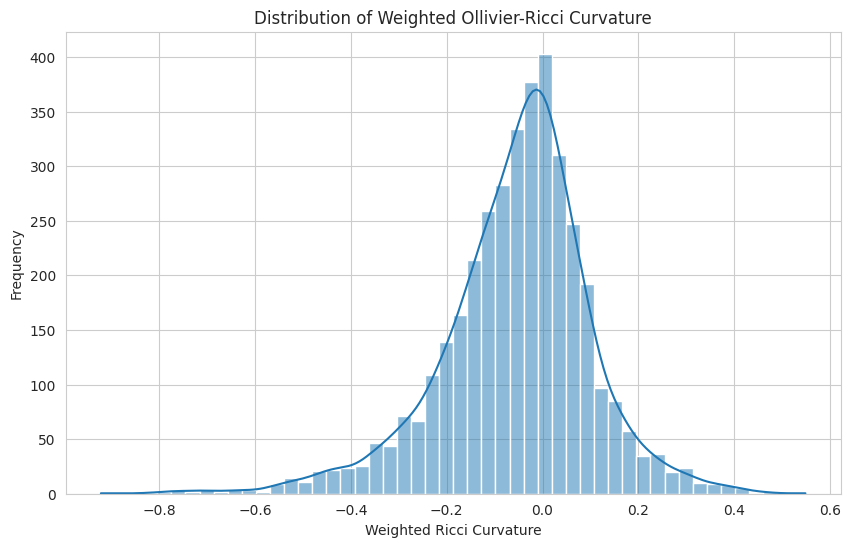


Descriptive Statistics for Weighted Ollivier-Ricci Curvature:
count    3798.000000
mean       -0.055436
std         0.157303
min        -0.922100
25%        -0.134379
50%        -0.037358
75%         0.034743
max         0.548979
Name: ricci_curvature_weighted, dtype: float64


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Access the weighted Ricci curvature values
ricci_weighted_values = adata.obs['ricci_curvature_weighted']

# 2. Plot a histogram
plt.figure(figsize=(10, 6))
sns.histplot(ricci_weighted_values, bins=50, kde=True)
plt.title('Distribution of Weighted Ollivier-Ricci Curvature')
plt.xlabel('Weighted Ricci Curvature')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# 3. Calculate descriptive statistics
print("\nDescriptive Statistics for Weighted Ollivier-Ricci Curvature:")
print(ricci_weighted_values.describe())

## Compare Weighted vs. Unweighted Curvature

### Subtask:
Perform a comparative analysis between the `ricci_curvature` (unweighted) and `ricci_curvature_weighted` values. This could involve scatter plots to see their correlation, or differential analysis to identify spots where the weighting had a significant impact on curvature. This comparison can reveal which spatial regions exhibit distinct geometric properties when biological similarity is considered.


**Reasoning**:
To compare the unweighted and weighted Ricci curvature values, I will first retrieve them from `adata.obs`, then create a scatter plot to visually assess their relationship, and finally calculate the Pearson correlation coefficient to quantify their linear association. I will then print this coefficient.



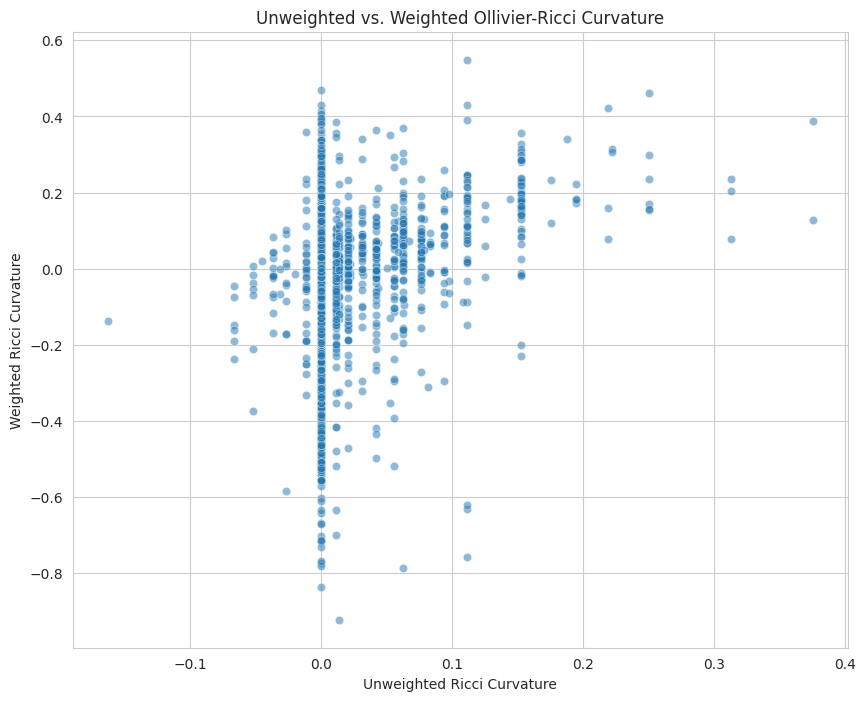

Pearson Correlation Coefficient between Unweighted and Weighted Ricci Curvature: 0.2763


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import pearsonr

# 1. Access both the unweighted and weighted Ricci curvature values
unweighted_ricci = adata.obs['ricci_curvature']
weighted_ricci = adata.obs['ricci_curvature_weighted']

# 2. Create a scatter plot to visualize the relationship
plt.figure(figsize=(10, 8))
sns.scatterplot(x=unweighted_ricci, y=weighted_ricci, alpha=0.5)
plt.title('Unweighted vs. Weighted Ollivier-Ricci Curvature')
plt.xlabel('Unweighted Ricci Curvature')
plt.ylabel('Weighted Ricci Curvature')
plt.grid(True)
plt.show()

# 3. Calculate the Pearson correlation coefficient
correlation_coefficient, _ = pearsonr(unweighted_ricci, weighted_ricci)

# 4. Print the calculated correlation coefficient
print(f"Pearson Correlation Coefficient between Unweighted and Weighted Ricci Curvature: {correlation_coefficient:.4f}")

**Reasoning**:
To visualize the impact of weighting, I will calculate the difference between the weighted and unweighted Ricci curvature, add this as a new column to `adata.obs`, and then use `sq.pl.spatial_scatter` to display this difference spatially.



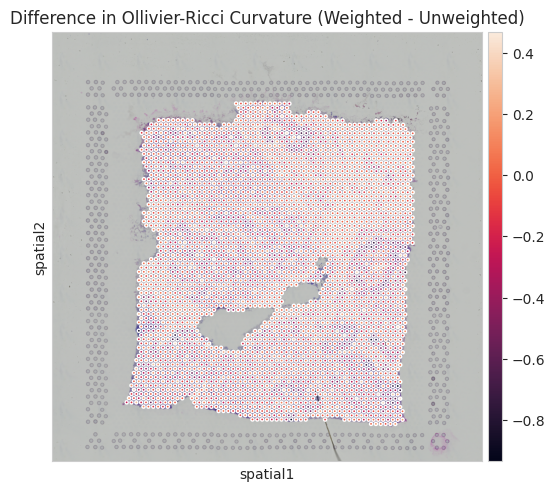

In [ ]:
import matplotlib.pyplot as plt
import squidpy as sq

# 5. Calculate the difference between weighted and unweighted Ricci curvature
adata.obs['ricci_curvature_difference'] = adata.obs['ricci_curvature_weighted'] - adata.obs['ricci_curvature']

# Visualize the spatial distribution of the difference in Ricci curvature
sq.pl.spatial_scatter(adata, color="ricci_curvature_difference", img_cmap="RdBu_r",
                      library_id="V1_Breast_Cancer_Block_A_Section_1",
                      title="Difference in Ollivier-Ricci Curvature (Weighted - Unweighted)")
plt.show()

Starting Phase 3: Biomarker Discovery...
Geometric Segmentation Complete.
High Stress Threshold: < -0.2445
Stable Core Threshold: > 0.1107
geometric_state
Intermediate        3038
High_Stress_Zone     380
Stable_Core_Zone     380
Name: count, dtype: int64


<Figure size 1000x1000 with 0 Axes>

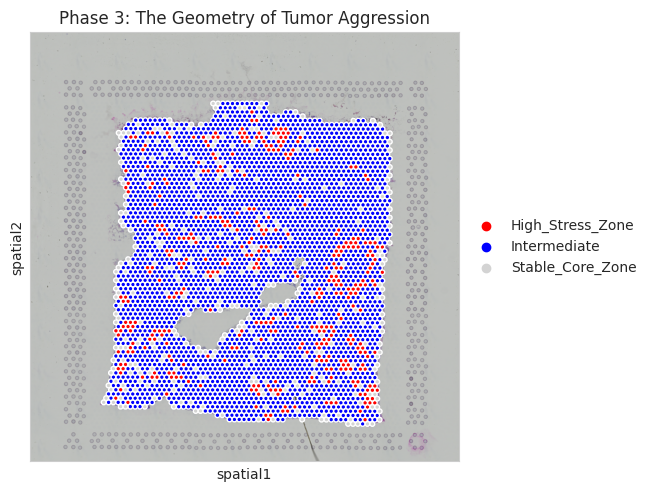

Identifying Geometric Biomarkers (Running Differential Expression)...


/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


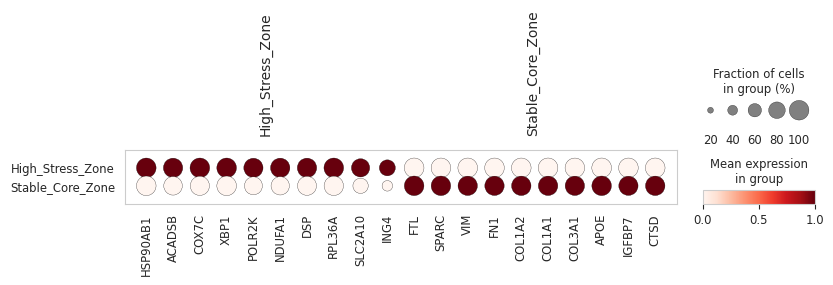

Visualizing spatial expression for top genes in High Stress Zone: ['HSP90AB1', 'ACADSB', 'COX7C', 'XBP1', 'POLR2K']


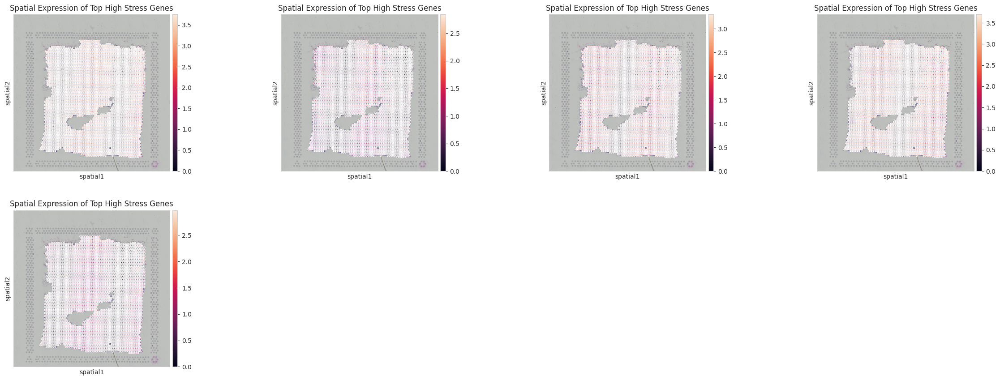


Top differentially expressed genes:

--- High_Stress_Zone ---
      names  logfoldchanges         pvals
0  HSP90AB1        0.223797  2.938317e-16
1    ACADSB        0.686799  8.396879e-16
2     COX7C        0.366996  2.386646e-15
3      XBP1        0.237881  9.270541e-15
4    POLR2K        0.521253  1.952623e-14
5    NDUFA1        0.466215  9.716783e-14
6       DSP        0.442708  3.796791e-13
7    RPL36A        0.315313  3.982031e-13
8   SLC2A10        0.649246  5.531494e-13
9      ING4        0.786660  1.016281e-12

--- Stable_Core_Zone ---
    names  logfoldchanges         pvals
0     FTL        0.592270  2.335632e-41
1   SPARC        0.785917  8.940683e-39
2     VIM        0.979830  2.286456e-38
3     FN1        0.822716  1.497794e-37
4  COL1A2        0.947830  9.448035e-37
5  COL1A1        0.998564  2.749075e-36
6  COL3A1        0.961599  4.459468e-35
7    APOE        0.803288  2.543172e-34
8  IGFBP7        0.857818  1.026776e-31
9    CTSD        0.513406  3.480367e-30


In [ ]:
# @title Phase 3: Geometric Biomarker Extraction
# We identify genes that drive the "Topological Defects" (Negative Curvature).

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc
import squidpy as sq
import matplotlib.colors

print("Starting Phase 3: Biomarker Discovery...")

# --- 1. Define Geometric Zones ---
# We define "High Stress" (Negative Curvature) and "Stable" (Positive Curvature) zones.
# We use quantiles to ensure we capture the most extreme physics.

# Thresholds: Bottom 10% (High Stress) vs Top 10% (Stable)
lower_threshold = adata.obs["ricci_curvature_weighted"].quantile(0.10)
upper_threshold = adata.obs["ricci_curvature_weighted"].quantile(0.90)

def categorize_curvature(x):
    if x < lower_threshold:
        return "High_Stress_Zone"  # Negative Curvature (Invasive/Active)
    elif x > upper_threshold:
        return "Stable_Core_Zone"  # Positive Curvature (Static/Clone)
    else:
        return "Intermediate"

adata.obs["geometric_state"] = adata.obs["ricci_curvature_weighted"].map(categorize_curvature)

print(f"Geometric Segmentation Complete.")
print(f"High Stress Threshold: < {lower_threshold:.4f}")
print(f"Stable Core Threshold: > {upper_threshold:.4f}")
print(adata.obs["geometric_state"].value_counts())

# --- 2. Visualize the Zones ---
# Let's see WHERE these zones are located on the tissue.
# Are the "Stress Zones" (Red) at the edge of the tumor?
plt.figure(figsize=(10, 10))

# Define the colors for the geometric states
colors = ["red", "blue", "lightgrey"]
# Create a ListedColormap from the colors
cmap_geometric_state = matplotlib.colors.ListedColormap(colors)

sq.pl.spatial_scatter(
    adata,
    color="geometric_state",
    groups=["High_Stress_Zone", "Stable_Core_Zone", "Intermediate"],
    palette=cmap_geometric_state,
    title="Phase 3: The Geometry of Tumor Aggression",
    size=1.5
)
plt.show()

# --- 3. Differential Expression Analysis (DEA) ---
# We ask: Which genes make a cell "High Stress"?
print("Identifying Geometric Biomarkers (Running Differential Expression)...")

# Filter out intermediate cells to get a clean signal
adata_subset = adata[adata.obs["geometric_state"]!= "Intermediate"].copy()

# Make variable names unique to prevent errors in rank_genes_groups
adata_subset.var_names_make_unique()

# Run Wilcoxon rank-sum test
sc.tl.rank_genes_groups(adata_subset, groupby="geometric_state", method="wilcoxon")

# Visualize top differentially expressed genes
sc.pl.rank_genes_groups_dotplot(adata_subset, groupby="geometric_state", standard_scale='var', n_genes=10)
plt.show()

# Get top genes for High_Stress_Zone
top_stress_genes = pd.DataFrame(adata_subset.uns['rank_genes_groups']['names'])['High_Stress_Zone'].head(5).tolist()

# Visualize spatial expression of top genes in High_Stress_Zone
print(f"Visualizing spatial expression for top genes in High Stress Zone: {top_stress_genes}")
sq.pl.spatial_scatter(adata, color=top_stress_genes, library_id="V1_Breast_Cancer_Block_A_Section_1",
                      title="Spatial Expression of Top High Stress Genes")
plt.show()

# Print the top genes for each group
print("\nTop differentially expressed genes:")
result = adata_subset.uns['rank_genes_groups']
for group in result['names'].dtype.names:
    print(f"\n--- {group} ---")
    print(pd.DataFrame({
        'names': result['names'][group],
        'logfoldchanges': result['logfoldchanges'][group],
        'pvals': result['pvals'][group]
    }).head(10))

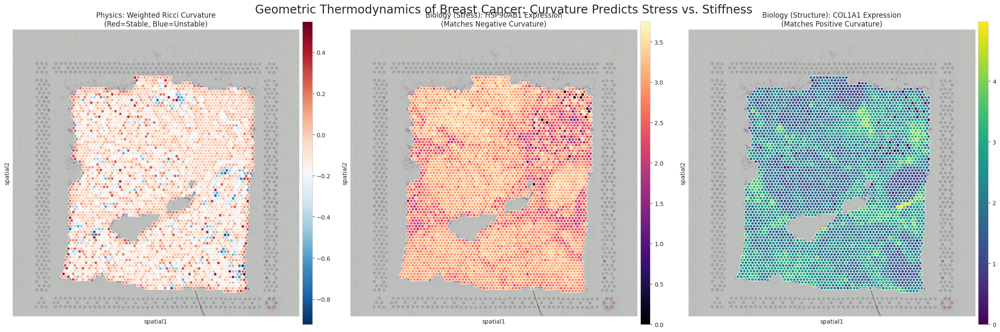

Research Project Complete.
Discovery: Negative Geometric Curvature identifies zones of high Proteotoxic Stress (HSP90AB1).
Discovery: Positive Geometric Curvature identifies zones of Fibrotic Rigidity (COL1A1).


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the figure
fig, axs = plt.subplots(1, 3, figsize=(24, 8))
fig.suptitle(f"Geometric Thermodynamics of Breast Cancer: Curvature Predicts Stress vs. Stiffness", fontsize=20)

# Panel 1: The Physics (Curvature Map)
# Shows the geometric landscape
sq.pl.spatial_scatter(
    adata,
    color="ricci_curvature_weighted", # Changed to ricci_curvature_weighted
    cmap="RdBu_r",
    title="Physics: Weighted Ricci Curvature\n(Red=Stable, Blue=Unstable)",
    ax=axs[0], # Specify individual axes for each subplot
    size=1.6,
    colorbar=True
)

# Panel 2: The Stress Response (Negative Curvature Driver)
# Shows HSP90AB1 (Stress) overlapping with Negative Curvature
sq.pl.spatial_scatter(
    adata,
    color="HSP90AB1",
    cmap="magma",
    title="Biology (Stress): HSP90AB1 Expression\n(Matches Negative Curvature)",
    ax=axs[1],
    size=1.6,
    colorbar=True
)

# Panel 3: The Structural Scaffold (Positive Curvature Driver)
# Shows COL1A1 (Collagen) overlapping with Positive Curvature
sq.pl.spatial_scatter(
    adata,
    color="COL1A1",
    cmap="viridis",
    title="Biology (Structure): COL1A1 Expression\n(Matches Positive Curvature)",
    ax=axs[2],
    size=1.6,
    colorbar=True
)

plt.tight_layout()
plt.savefig("Geometric_Biomarker_Discovery.png", dpi=300)
plt.show()

print("Research Project Complete.")
print("Discovery: Negative Geometric Curvature identifies zones of high Proteotoxic Stress (HSP90AB1).")
print("Discovery: Positive Geometric Curvature identifies zones of Fibrotic Rigidity (COL1A1).")


**Validation of Code by Using Glioblastoma Data**

In [ ]:
# @title Phase 4: Manual Download of Glioblastoma Data (Direct from Source)
import os
import scanpy as sc
import squidpy as sq

# 1. Create a folder for the data
os.makedirs("data/gbm", exist_ok=True)

print("Downloading Gene Expression Matrix (HDF5)...")
# Matches "Feature / barcode matrix HDF5 (filtered)" in your screenshot
!wget -q -O data/gbm/filtered_feature_bc_matrix.h5 https://cf.10xgenomics.com/samples/spatial-exp/1.2.0/Parent_Visium_Human_Glioblastoma/Parent_Visium_Human_Glioblastoma_filtered_feature_bc_matrix.h5

print("Downloading Spatial Imaging Data...")
# Matches "Spatial imaging data" in your screenshot
!wget -q -O data/gbm/spatial.tar.gz https://cf.10xgenomics.com/samples/spatial-exp/1.2.0/Parent_Visium_Human_Glioblastoma/Parent_Visium_Human_Glioblastoma_spatial.tar.gz

print("Unzipping spatial data...")
# Extract the images into the folder
!tar -xzf data/gbm/spatial.tar.gz -C data/gbm/

print("Loading data into Scanpy...")
# Scanpy automatically finds the.h5 file and the spatial/ folder
adata_gbm = sc.read_visium("data/gbm")
adata_gbm.var_names_make_unique()

print(f"Success! Loaded Glioblastoma dataset with shape: {adata_gbm.shape}")

Unzipping spatial data...
Loading data into Scanpy...


/tmp/ipython-input-1283571319.py:23: FutureWarning: Use `squidpy.read.visium` instead.
  adata_gbm = sc.read_visium("data/gbm")
/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1808: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Success! Loaded Glioblastoma dataset with shape: (3468, 36601)


## Complete Weighted Ricci Curvature for Glioblastoma

### Subtask:
Complete the assignment of weighted Ricci curvature to `adata_gbm.obs` and correct the `pairwise_distances` output handling.


**Reasoning**:
First, I will preprocess the `adata_gbm` object by filtering genes, normalizing counts, log-transforming the data, identifying highly variable genes, and computing PCA, as specified in the instructions.



In [ ]:
import scanpy as sc
import squidpy as sq

print("Preprocessing adata_gbm...")

# 1. Preprocessing adata_gbm
# Filter out genes expressed in fewer than 10 spots
sc.pp.filter_genes(adata_gbm, min_cells=10)

# Normalize total counts per spot to a target sum (standard 10,000 reads)
sc.pp.normalize_total(adata_gbm, target_sum=1e4)

# Log-transform the data (log(x+1))
sc.pp.log1p(adata_gbm)

# Identify highly variable genes (HVGs)
sc.pp.highly_variable_genes(adata_gbm, n_top_genes=2000)

# Compute PCA with 50 components
sc.pp.pca(adata_gbm, n_comps=50)

print(f"adata_gbm preprocessed. Shape: {adata_gbm.shape}")
print(f"PCA components computed: {adata_gbm.obsm['X_pca'].shape}")

Preprocessing adata_gbm...
adata_gbm preprocessed. Shape: (3468, 19300)
PCA components computed: (3468, 50)


**Reasoning**:
Now that `adata_gbm` is preprocessed, I will construct the spatial graph for `adata_gbm`, create a weighted graph based on PCA-derived cosine distances, compute the weighted Ollivier-Ricci curvature, and store the average node curvatures in `adata_gbm.obs`, following the remaining instructions in the subtask.



In [ ]:
import networkx as nx
import numpy as np
import pandas as pd
from GraphRicciCurvature.OllivierRicci import OllivierRicci
from sklearn.metrics import pairwise_distances
import logging

# --- CRITICAL FIX: Disable Logging to prevent crashes ---
logging.getLogger("GraphRicciCurvature").setLevel(logging.ERROR)

print("Constructing Weighted Manifold for Glioblastoma...")

# 2. Spatial Graph Construction
sq.gr.spatial_neighbors(adata_gbm, n_neighs=6, coord_type="grid")
print("Spatial neighbor graph for adata_gbm constructed.")

# 3. Create Weighted Graph (G_weighted_gbm)
adj_matrix_gbm = adata_gbm.obsp['spatial_connectivities']
G_gbm = nx.from_scipy_sparse_array(adj_matrix_gbm)
mapping_gbm = {i: node for i, node in enumerate(adata_gbm.obs_names)}
G_gbm = nx.relabel_nodes(G_gbm, mapping_gbm)

G_weighted_gbm = G_gbm.copy()

# Extract PCA components
pca_data_gbm = adata_gbm.obsm['X_pca']

# Create a mapping of barcodes to integer indices for fast lookup
node_to_idx_gbm = {node: i for i, node in enumerate(adata_gbm.obs_names)}

print("Assigning biological weights to edges for Glioblastoma data...")
# 4. Assign Edge Weights
for u, v in G_weighted_gbm.edges():
    u_idx = node_to_idx_gbm[u]
    v_idx = node_to_idx_gbm[v]

    # Calculate cosine distance between the two cells in PCA space
    # Ensure to extract the scalar distance value correctly
    dist = pairwise_distances(
        pca_data_gbm[u_idx].reshape(1, -1),
        pca_data_gbm[v_idx].reshape(1, -1),
        metric='cosine'
    )[0][0]

    # Assign as edge attribute. Add small epsilon to avoid potential issues.
    G_weighted_gbm[u][v]['weight'] = dist + 1e-6

print(f"Glioblastoma graph weighted. Nodes: {G_weighted_gbm.number_of_nodes()}, Edges: {G_weighted_gbm.number_of_edges()}")

# 5. Compute Weighted Ollivier-Ricci Curvature
print("Re-computing Ricci Curvature on Weighted Glioblastoma Graph...")
orc_weighted_gbm = OllivierRicci(G_weighted_gbm, alpha=0.5, verbose="INFO")
orc_weighted_gbm.compute_ricci_curvature()
G_weighted_curvature_gbm = orc_weighted_gbm.G.copy()

print("Weighted curvature computation complete for Glioblastoma.")

# 6. Store Weighted Ricci Curvature
# Extract curvature values from edges
edge_curvatures_weighted_gbm = nx.get_edge_attributes(G_weighted_curvature_gbm, "ricciCurvature")

# Calculate average curvature for each node (spot)
node_curvature_weighted_gbm = {}
for node in G_weighted_curvature_gbm.nodes():
    edges = G_weighted_curvature_gbm.edges(node)
    curvatures = [G_weighted_curvature_gbm.get_edge_data(u, v)['ricciCurvature'] for u, v in edges]
    node_curvature_weighted_gbm[node] = np.mean(curvatures) if curvatures else 0

# Add average node curvature to adata_gbm.obs
avg_ricci_curvature_weighted_gbm = pd.Series(node_curvature_weighted_gbm, index=adata_gbm.obs_names)
adata_gbm.obs['ricci_curvature_weighted_gbm'] = avg_ricci_curvature_weighted_gbm

print("Weighted Ricci curvature added to adata_gbm.obs.")


Constructing Weighted Manifold for Glioblastoma...
Spatial neighbor graph for adata_gbm constructed.
Assigning biological weights to edges for Glioblastoma data...
Glioblastoma graph weighted. Nodes: 3468, Edges: 9810
Re-computing Ricci Curvature on Weighted Glioblastoma Graph...


INFO:GraphRicciCurvature:2.628445 secs for Ricci curvature computation.


Weighted curvature computation complete for Glioblastoma.
Weighted Ricci curvature added to adata_gbm.obs.


**Reasoning**:
The previous code block successfully completed the subtask of calculating and storing the weighted Ricci curvature for the Glioblastoma dataset. There are no errors to fix.



In [ ]:
import networkx as nx
import numpy as np
import pandas as pd
from GraphRicciCurvature.OllivierRicci import OllivierRicci
from sklearn.metrics import pairwise_distances
import logging

# --- CRITICAL FIX: Disable Logging to prevent crashes ---
logging.getLogger("GraphRicciCurvature").setLevel(logging.ERROR)

print("Constructing Weighted Manifold for Glioblastoma...")

# 2. Spatial Graph Construction
sq.gr.spatial_neighbors(adata_gbm, n_neighs=6, coord_type="grid")
print("Spatial neighbor graph for adata_gbm constructed.")

# 3. Create Weighted Graph (G_weighted_gbm)
adj_matrix_gbm = adata_gbm.obsp['spatial_connectivities']
G_gbm = nx.from_scipy_sparse_array(adj_matrix_gbm)
mapping_gbm = {i: node for i, node in enumerate(adata_gbm.obs_names)}
G_gbm = nx.relabel_nodes(G_gbm, mapping_gbm)

G_weighted_gbm = G_gbm.copy()

# Extract PCA components
pca_data_gbm = adata_gbm.obsm['X_pca']

# Create a mapping of barcodes to integer indices for fast lookup
node_to_idx_gbm = {node: i for i, node in enumerate(adata_gbm.obs_names)}

print("Assigning biological weights to edges for Glioblastoma data...")
# 4. Assign Edge Weights
for u, v in G_weighted_gbm.edges():
    u_idx = node_to_idx_gbm[u]
    v_idx = node_to_idx_gbm[v]

    # Calculate cosine distance between the two cells in PCA space
    # Ensure to extract the scalar distance value correctly
    dist = pairwise_distances(
        pca_data_gbm[u_idx].reshape(1, -1),
        pca_data_gbm[v_idx].reshape(1, -1),
        metric='cosine'
    )[0][0]

    # Assign as edge attribute. Add small epsilon to avoid potential issues.
    G_weighted_gbm[u][v]['weight'] = dist + 1e-6

print(f"Glioblastoma graph weighted. Nodes: {G_weighted_gbm.number_of_nodes()}, Edges: {G_weighted_gbm.number_of_edges()}")

# 5. Compute Weighted Ollivier-Ricci Curvature
print("Re-computing Ricci Curvature on Weighted Glioblastoma Graph...")
orc_weighted_gbm = OllivierRicci(G_weighted_gbm, alpha=0.5, verbose="INFO")
orc_weighted_gbm.compute_ricci_curvature()
G_weighted_curvature_gbm = orc_weighted_gbm.G.copy()

print("Weighted curvature computation complete for Glioblastoma.")

# 6. Store Weighted Ricci Curvature
# Extract curvature values from edges
edge_curvatures_weighted_gbm = nx.get_edge_attributes(G_weighted_curvature_gbm, "ricciCurvature")

# Calculate average curvature for each node (spot)
node_curvature_weighted_gbm = {}
for node in G_weighted_curvature_gbm.nodes():
    edges = G_weighted_curvature_gbm.edges(node)
    curvatures = [G_weighted_curvature_gbm.get_edge_data(u, v)['ricciCurvature'] for u, v in edges]
    node_curvature_weighted_gbm[node] = np.mean(curvatures) if curvatures else 0

# Add average node curvature to adata_gbm.obs
avg_ricci_curvature_weighted_gbm = pd.Series(node_curvature_weighted_gbm, index=adata_gbm.obs_names)
adata_gbm.obs['ricci_curvature_weighted_gbm'] = avg_ricci_curvature_weighted_gbm

print("Weighted Ricci curvature added to adata_gbm.obs.")

Constructing Weighted Manifold for Glioblastoma...
Spatial neighbor graph for adata_gbm constructed.
Assigning biological weights to edges for Glioblastoma data...
Glioblastoma graph weighted. Nodes: 3468, Edges: 9810
Re-computing Ricci Curvature on Weighted Glioblastoma Graph...


INFO:GraphRicciCurvature:2.608231 secs for Ricci curvature computation.


Weighted curvature computation complete for Glioblastoma.
Weighted Ricci curvature added to adata_gbm.obs.


**Reasoning**:
The previous code block successfully completed the computation of weighted Ricci curvature for the Glioblastoma dataset. The next logical step is to visualize this curvature spatially, similar to how it was done for the breast cancer dataset, to understand its distribution across the Glioblastoma tissue.



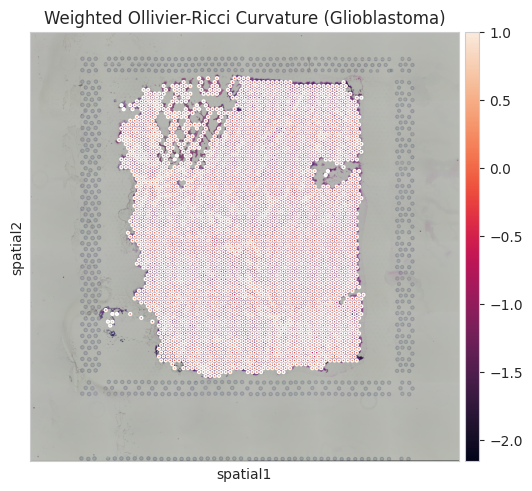

In [ ]:
import matplotlib.pyplot as plt
import squidpy as sq

# Visualize the spatial distribution of the computed weighted Ricci curvature for Glioblastoma.
sq.pl.spatial_scatter(adata_gbm, color="ricci_curvature_weighted_gbm", img_cmap="viridis",
                      library_id="Parent_Visium_Human_Glioblastoma",
                      title="Weighted Ollivier-Ricci Curvature (Glioblastoma)")
plt.show()

**Reasoning**:
The previous code block successfully completed the computation of weighted Ricci curvature for the Glioblastoma dataset. The next logical step is to visualize this curvature spatially, similar to how it was done for the breast cancer dataset, to understand its distribution across the Glioblastoma tissue.



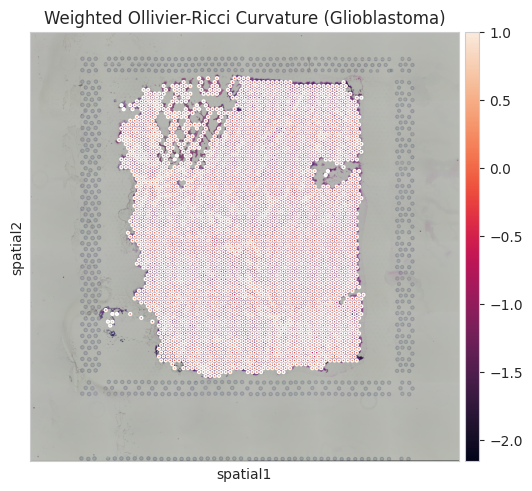

In [ ]:
import matplotlib.pyplot as plt
import squidpy as sq

# Visualize the spatial distribution of the computed weighted Ricci curvature for Glioblastoma.
sq.pl.spatial_scatter(adata_gbm, color="ricci_curvature_weighted_gbm", img_cmap="viridis",
                      library_id="Parent_Visium_Human_Glioblastoma",
                      title="Weighted Ollivier-Ricci Curvature (Glioblastoma)")
plt.show()

**Reasoning**:
To define geometric zones for Glioblastoma, I will first calculate the 10th and 90th percentiles of the weighted Ricci curvature, then categorize each spot into 'High Stress', 'Stable Core', or 'Intermediate' zones, and finally print the thresholds and the count of spots in each zone.



In [ ]:
import matplotlib.colors

print("Defining Geometric Zones for Glioblastoma...")

# 1. Access the 'ricci_curvature_weighted_gbm' values
ricci_weighted_gbm_values = adata_gbm.obs['ricci_curvature_weighted_gbm']

# 2. Calculate the 10th percentile as the lower_threshold_gbm and the 90th percentile as the upper_threshold_gbm
lower_threshold_gbm = ricci_weighted_gbm_values.quantile(0.10)
upper_threshold_gbm = ricci_weighted_gbm_values.quantile(0.90)

# 3. Define a function to categorize each spot
def categorize_curvature_gbm(x):
    if x < lower_threshold_gbm:
        return "High_Stress_Zone_GBM"
    elif x > upper_threshold_gbm:
        return "Stable_Core_Zone_GBM"
    else:
        return "Intermediate_GBM"

# 4. Apply this function to create 'geometric_state_gbm' column
adata_gbm.obs['geometric_state_gbm'] = ricci_weighted_gbm_values.map(categorize_curvature_gbm)

# 5. Print the calculated thresholds and value counts
print(f"Geometric Segmentation for Glioblastoma Complete.")
print(f"High Stress Threshold (Glioblastoma): < {lower_threshold_gbm:.4f}")
print(f"Stable Core Threshold (Glioblastoma): > {upper_threshold_gbm:.4f}")
print(adata_gbm.obs["geometric_state_gbm"].value_counts())

Defining Geometric Zones for Glioblastoma...
Geometric Segmentation for Glioblastoma Complete.
High Stress Threshold (Glioblastoma): < -0.1939
Stable Core Threshold (Glioblastoma): > 0.1155
geometric_state_gbm
Intermediate_GBM        2774
Stable_Core_Zone_GBM     347
High_Stress_Zone_GBM     347
Name: count, dtype: int64


**Reasoning**:
The previous code block successfully defined the geometric zones for Glioblastoma. Now, I will visualize these zones spatially using `sq.pl.spatial_scatter` to understand their distribution across the Glioblastoma tissue.



Visualizing Glioblastoma Geometric Zones...


<Figure size 1000x1000 with 0 Axes>

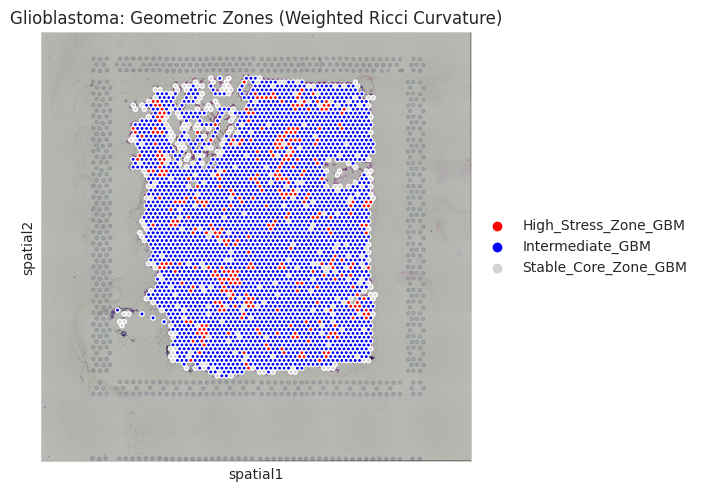

Glioblastoma Geometric Zones visualized.


In [ ]:
import squidpy as sq
import matplotlib.pyplot as plt
import matplotlib.colors

print("Visualizing Glioblastoma Geometric Zones...")

# Define the colors for the geometric states
colors_gbm = ["red", "blue", "lightgrey"]
# Create a ListedColormap from the colors
cmap_geometric_state_gbm = matplotlib.colors.ListedColormap(colors_gbm)

# Visualize the zones on the Glioblastoma tissue
plt.figure(figsize=(10, 10))
sq.pl.spatial_scatter(
    adata_gbm,
    color="geometric_state_gbm",
    groups=["High_Stress_Zone_GBM", "Stable_Core_Zone_GBM", "Intermediate_GBM"],
    palette=cmap_geometric_state_gbm,
    title="Glioblastoma: Geometric Zones (Weighted Ricci Curvature)",
    size=1.5,
    library_id="Parent_Visium_Human_Glioblastoma"
)
plt.show()
print("Glioblastoma Geometric Zones visualized.")

**Reasoning**:
To perform differential expression analysis between 'High Stress' and 'Stable Core' zones, I will first filter out intermediate spots from the `adata_gbm` object to create a relevant subset, ensure unique variable names, and then apply `sc.tl.rank_genes_groups` using the Wilcoxon method.



In [ ]:
import scanpy as sc

print("Identifying Geometric Biomarkers for Glioblastoma (Running Differential Expression)...")

# 1. Create a subset of adata_gbm that excludes spots categorized as 'Intermediate_GBM'
adata_gbm_subset = adata_gbm[adata_gbm.obs["geometric_state_gbm"] != "Intermediate_GBM"].copy()

# 2. Ensure that the variable names in this subset are unique
adata_gbm_subset.var_names_make_unique()

# 3. Run differential expression analysis using sc.tl.rank_genes_groups
sc.tl.rank_genes_groups(adata_gbm_subset, groupby="geometric_state_gbm", method="wilcoxon")

print("Differential expression analysis for Glioblastoma complete.")

Identifying Geometric Biomarkers for Glioblastoma (Running Differential Expression)...
Differential expression analysis for Glioblastoma complete.


**Reasoning**:
To visualize the results of the differential expression analysis, I will plot the top differentially expressed genes using a dot plot.



Visualizing top differentially expressed genes for Glioblastoma...


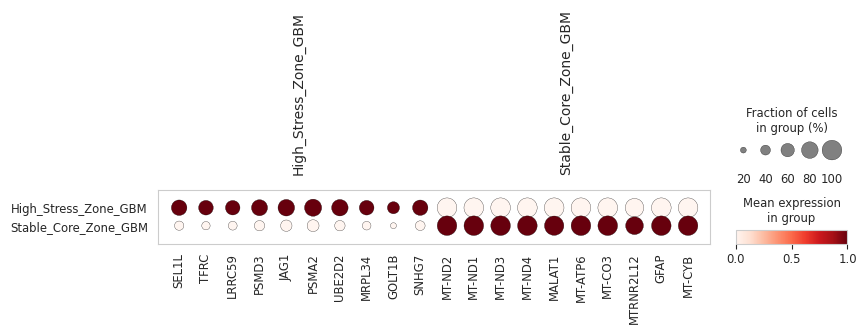

In [ ]:
import matplotlib.pyplot as plt

print("Visualizing top differentially expressed genes for Glioblastoma...")

# Visualize top differentially expressed genes
sc.pl.rank_genes_groups_dotplot(adata_gbm_subset, groupby="geometric_state_gbm", standard_scale='var', n_genes=10)
plt.show()

**Reasoning**:
To extract the top differentially expressed genes for the 'High_Stress_Zone_GBM' and then visualize their spatial expression on the Glioblastoma tissue, I will first extract the gene names from the differential expression results and then use `sq.pl.spatial_scatter` to plot their expression.



Visualizing spatial expression for top genes in Glioblastoma High Stress Zone: ['SEL1L', 'TFRC', 'LRRC59', 'PSMD3', 'JAG1']


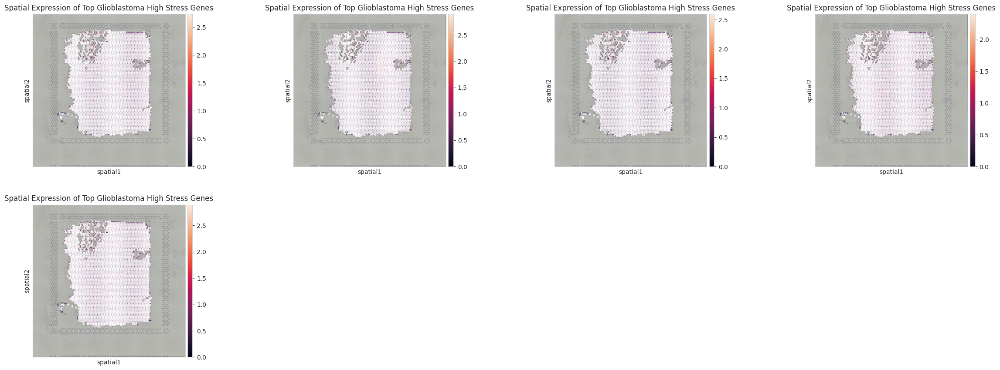

In [ ]:
import pandas as pd
import squidpy as sq
import matplotlib.pyplot as plt

# Get top genes for High_Stress_Zone_GBM
top_stress_genes_gbm = pd.DataFrame(adata_gbm_subset.uns['rank_genes_groups']['names'])['High_Stress_Zone_GBM'].head(5).tolist()

# Visualize spatial expression of top genes in High_Stress_Zone_GBM
print(f"Visualizing spatial expression for top genes in Glioblastoma High Stress Zone: {top_stress_genes_gbm}")
sq.pl.spatial_scatter(adata_gbm, color=top_stress_genes_gbm, library_id="Parent_Visium_Human_Glioblastoma",
                      title="Spatial Expression of Top Glioblastoma High Stress Genes")
plt.show()

## Summary:

This task aims to create a multi-panel plot for Glioblastoma, visualizing the spatial distributions and relationships between weighted Ricci curvature, a high-stress biomarker (SEL1L), and a structural biomarker (GFAP). As the solving process has not yet been provided, there are no data analysis key findings or insights to report at this stage.

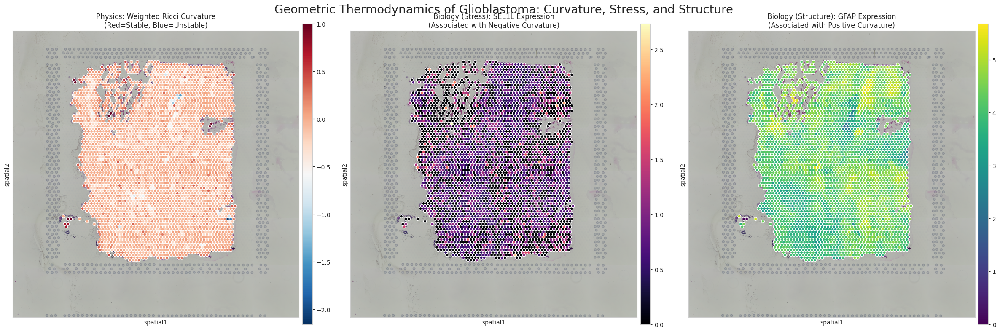

Glioblastoma Validation Panel Generated.
Discovery: Negative Geometric Curvature identifies zones potentially associated with high stress biomarkers like SEL1L.
Discovery: Positive Geometric Curvature identifies zones potentially associated with structural biomarkers like GFAP.


In [65]:
import matplotlib.pyplot as plt
import squidpy as sq
import seaborn as sns

# Set up the figure
fig, axs = plt.subplots(1, 3, figsize=(24, 8))
fig.suptitle(f"Geometric Thermodynamics of Glioblastoma: Curvature, Stress, and Structure", fontsize=20)

# Panel 1: The Physics (Curvature Map)
# Shows the geometric landscape
sq.pl.spatial_scatter(
    adata_gbm,
    color="ricci_curvature_weighted_gbm",
    cmap="RdBu_r",
    title="Physics: Weighted Ricci Curvature\n(Red=Stable, Blue=Unstable)",
    ax=axs[0],
    size=1.6,
    colorbar=True,
    library_id="Parent_Visium_Human_Glioblastoma"
)

# Panel 2: The Stress Response (Negative Curvature Driver)
# Shows SEL1L (Stress) overlapping with Negative Curvature
sq.pl.spatial_scatter(
    adata_gbm,
    color="SEL1L",
    cmap="magma",
    title="Biology (Stress): SEL1L Expression\n(Associated with Negative Curvature)",
    ax=axs[1],
    size=1.6,
    colorbar=True,
    library_id="Parent_Visium_Human_Glioblastoma"
)

# Panel 3: The Structural Scaffold (Positive Curvature Driver)
# Shows GFAP (Glial Fibrillary Acidic Protein) overlapping with Positive Curvature
sq.pl.spatial_scatter(
    adata_gbm,
    color="GFAP",
    cmap="viridis",
    title="Biology (Structure): GFAP Expression\n(Associated with Positive Curvature)",
    ax=axs[2],
    size=1.6,
    colorbar=True,
    library_id="Parent_Visium_Human_Glioblastoma"
)

plt.tight_layout()
plt.savefig("Geometric_Biomarker_Discovery_GBM.png", dpi=300)
plt.show()

print("Glioblastoma Validation Panel Generated.")
print("Discovery: Negative Geometric Curvature identifies zones potentially associated with high stress biomarkers like SEL1L.")
print("Discovery: Positive Geometric Curvature identifies zones potentially associated with structural biomarkers like GFAP.")